In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import numpy as np

In [4]:
current_path = os.getcwd()
current_path

'/Users/alemshaimardanov/PycharmProjects/CompSocSci'

In [14]:
movies_df = pd.read_csv(current_path + '/movies_cast_2.csv')
movies_df

,index,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,tmdb_id,og_language,budget,revenue,ratio,ROI,averageRating,numVotes,Unnamed: 18,nconst
0,7363,tt1179904,movie,Paranormal Activity,Paranormal Activity,0,2007,NaN,86,"Horror,Mystery",23827,en,230000,194183034,0.001184,844.274061,6.3,238846,Info says budget is $15k,"['nm2209370', 'nm2913790', 'nm2104166', 'nm291..."
1,4907,tt2309260,movie,The Gallows,The Gallows,0,2015,NaN,81,"Horror,Mystery,Thriller",299245,en,100000,42664410,0.002344,426.644100,4.2,20611,NaN,"['nm3790547', 'nm6018502', 'nm4090362', 'nm225..."
2,8453,tt0876294,movie,Zombie Diaries,The Zombie Diaries,0,2006,NaN,85,"Horror,Sci-Fi",25035,en,9300,2000000,0.004650,215.053763,4.0,4755,NaN,"['nm0014714', 'nm2428131', 'nm2408572', 'nm028..."
3,9342,tt0907657,movie,Once,Once,0,2007,NaN,86,"Drama,Music,Romance",5723,en,160000,20710513,0.007726,129.440706,7.8,116662,NaN,"['nm0360598', 'nm2461627', 'nm2008013', 'nm247..."
4,2405,tt0374900,movie,Napoleon Dynamite,Napoleon Dynamite,0,2004,NaN,96,Comedy,8193,en,400000,46118097,0.008673,115.295243,6.9,218880,NaN,"['nm1417647', 'nm0708293', 'nm0340973', 'nm108..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3535,10702,tt1935194,movie,Overdrive,Overdrive,0,2017,NaN,93,"Action,Adventure,Crime",404733,en,28210303,7793,3619.954190,0.000276,5.3,14982,NaN,"['nm2207222', 'nm7188414', 'nm1869101', 'nm471..."
3536,414,tt1376213,movie,The Adventurer: The Curse of the Midas Box,The Adventurer: The Curse of the Midas Box,0,2013,NaN,100,"Adventure,Family,Fantasy",227707,en,25000000,6399,3906.860447,0.000256,5.4,6779,NaN,"['nm2902567', 'nm0790688', 'nm0372176', 'nm000..."
3537,9979,tt7869070,movie,The Fanatic,The Fanatic,0,2019,NaN,88,"Crime,Thriller",509853,en,18000000,3153,5708.848716,0.000175,4.2,11981,NaN,"['nm0000237', 'nm0001701', 'nm3132111', 'nm362..."
3538,3185,tt0254703,movie,The Point Men,The Point Men,0,2001,NaN,100,"Action,Drama",46943,en,6100000,714,8543.417367,0.000117,4.3,1161,NaN,"['nm0000483', 'nm0289098', 'nm0716490', 'nm053..."


In [15]:
# Count number of genres in df
'''
1. Split genres by ',' => convert string into a list
2. Loop through genres column and every element of single list. Add it to hashset of genres.
3. Create a dictionary (key = genre, value = [movie_1, movie_2, ..., movie_n])

'''
movies_df['genres_list'] = movies_df.genres.str[:].str.split(',').tolist()

In [16]:
movies_df

,index,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,...,og_language,budget,revenue,ratio,ROI,averageRating,numVotes,Unnamed: 18,nconst,genres_list
0,7363,tt1179904,movie,Paranormal Activity,Paranormal Activity,0,2007,NaN,86,"Horror,Mystery",...,en,230000,194183034,0.001184,844.274061,6.3,238846,Info says budget is $15k,"['nm2209370', 'nm2913790', 'nm2104166', 'nm291...","[Horror, Mystery]"
1,4907,tt2309260,movie,The Gallows,The Gallows,0,2015,NaN,81,"Horror,Mystery,Thriller",...,en,100000,42664410,0.002344,426.644100,4.2,20611,NaN,"['nm3790547', 'nm6018502', 'nm4090362', 'nm225...","[Horror, Mystery, Thriller]"
2,8453,tt0876294,movie,Zombie Diaries,The Zombie Diaries,0,2006,NaN,85,"Horror,Sci-Fi",...,en,9300,2000000,0.004650,215.053763,4.0,4755,NaN,"['nm0014714', 'nm2428131', 'nm2408572', 'nm028...","[Horror, Sci-Fi]"
3,9342,tt0907657,movie,Once,Once,0,2007,NaN,86,"Drama,Music,Romance",...,en,160000,20710513,0.007726,129.440706,7.8,116662,NaN,"['nm0360598', 'nm2461627', 'nm2008013', 'nm247...","[Drama, Music, Romance]"
4,2405,tt0374900,movie,Napoleon Dynamite,Napoleon Dynamite,0,2004,NaN,96,Comedy,...,en,400000,46118097,0.008673,115.295243,6.9,218880,NaN,"['nm1417647', 'nm0708293', 'nm0340973', 'nm108...",[Comedy]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3535,10702,tt1935194,movie,Overdrive,Overdrive,0,2017,NaN,93,"Action,Adventure,Crime",...,en,28210303,7793,3619.954190,0.000276,5.3,14982,NaN,"['nm2207222', 'nm7188414', 'nm1869101', 'nm471...","[Action, Adventure, Crime]"
3536,414,tt1376213,movie,The Adventurer: The Curse of the Midas Box,The Adventurer: The Curse of the Midas Box,0,2013,NaN,100,"Adventure,Family,Fantasy",...,en,25000000,6399,3906.860447,0.000256,5.4,6779,NaN,"['nm2902567', 'nm0790688', 'nm0372176', 'nm000...","[Adventure, Family, Fantasy]"
3537,9979,tt7869070,movie,The Fanatic,The Fanatic,0,2019,NaN,88,"Crime,Thriller",...,en,18000000,3153,5708.848716,0.000175,4.2,11981,NaN,"['nm0000237', 'nm0001701', 'nm3132111', 'nm362...","[Crime, Thriller]"
3538,3185,tt0254703,movie,The Point Men,The Point Men,0,2001,NaN,100,"Action,Drama",...,en,6100000,714,8543.417367,0.000117,4.3,1161,NaN,"['nm0000483', 'nm0289098', 'nm0716490', 'nm053...","[Action, Drama]"


In [17]:
# Add genres to set
genres_set = set()

for index, row in movies_df.iterrows():
#     print(row['genres_list'])
    for genre in row['genres_list']:
        genres_set.add(genre)

In [18]:
print(len(genres_set))

21


In [19]:
genres_set

{'Action',
 'Adventure',
 'Biography',
 'Comedy',
 'Crime',
 'Documentary',
 'Drama',
 'Family',
 'Fantasy',
 'History',
 'Horror',
 'Music',
 'Musical',
 'Mystery',
 'News',
 'Romance',
 'Sci-Fi',
 'Sport',
 'Thriller',
 'War',
 'Western'}

In [20]:
# Create a dictionary of movies
movies_dict = {}
for genre in genres_set:
    movies_dict[genre] = []

for index, row in movies_df.iterrows():
    # Add movie to its corresponding genre
    for genre in row['genres_list']:
        movies_dict[genre].append(row)

In [12]:
movies_dict

{'Romance': [index                                9342
  tconst                          tt0907657
  titleType                           movie
  primaryTitle                         Once
  originalTitle                        Once
  isAdult                                 0
  startYear                            2007
  endYear                               NaN
  runtimeMinutes                         86
  genres                Drama,Music,Romance
  tmdb_id                              5723
  og_language                            en
  budget                             160000
  revenue                          20710513
  ratio                            0.007726
  ROI                            129.440706
  averageRating                         7.8
  numVotes                           116662
  Unnamed: 18                           NaN
  genres_list       [Drama, Music, Romance]
  Name: 4, dtype: object,
  index                                 3502
  tconst                           tt0

In [22]:
# type(movies_dict['Comedy'][0]['budget'])
len(movies_dict['Comedy'])

1252

In [94]:
genre_list = movies_dict['Action']
print(len(genre_list))

996


In [95]:
genre_df = pd.DataFrame(genre_list)
genre_df

,index,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,tmdb_id,og_language,budget,revenue,ratio,ROI,averageRating,numVotes,Unnamed: 18,genres_list
34,7549,tt0844479,movie,The Collector,The Collector,0,2009,NaN,90,"Action,Horror,Thriller",21407,en,3400000,114000000,0.029825,33.529412,6.3,65644,NaN,"[Action, Horror, Thriller]"
60,4176,tt1801113,movie,The Worst Movie Ever!,The Worst Movie Ever!,0,2011,NaN,76,"Action,Comedy,Musical",359348,en,1100,25206,0.043640,22.914545,3.9,189,NaN,"[Action, Comedy, Musical]"
73,10679,tt0340110,movie,Fat Pizza,Fat Pizza,0,2003,NaN,96,"Action,Adventure,Comedy",15603,en,400000,7888102,0.050709,19.720255,5.6,3640,NaN,"[Action, Adventure, Comedy]"
83,4667,tt5886046,movie,Escape Room,Escape Room,0,2019,NaN,99,"Action,Adventure,Horror",522681,en,9000000,155712077,0.057799,17.301342,6.4,121425,NaN,"[Action, Adventure, Horror]"
118,4897,tt1431045,movie,Deadpool,Deadpool,0,2016,NaN,108,"Action,Adventure,Comedy",293660,en,58000000,783100000,0.074065,13.501724,8.0,1020682,NaN,"[Action, Adventure, Comedy]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3577,7133,tt0300902,movie,Absolon,Absolon,0,2003,NaN,96,"Action,Sci-Fi,Thriller",4612,en,8000000,7016,1140.250855,0.000877,4.2,3178,NaN,"[Action, Sci-Fi, Thriller]"
3580,7346,tt6749318,movie,Speed Kills,Speed Kills,0,2018,NaN,102,"Action,Crime,Drama",466411,en,15000000,5812,2580.867171,0.000387,4.3,3493,NaN,"[Action, Crime, Drama]"
3581,5376,tt5208950,movie,Kickboxer: Retaliation,Kickboxer: Retaliation,0,2018,NaN,110,"Action,Drama",447665,en,13000000,4537,2865.329513,0.000349,5.0,5489,NaN,"[Action, Drama]"
3582,10702,tt1935194,movie,Overdrive,Overdrive,0,2017,NaN,93,"Action,Adventure,Crime",404733,en,28210303,7793,3619.954190,0.000276,5.3,14982,NaN,"[Action, Adventure, Crime]"


In [37]:
'''
1. Group movies from each genre by year;
2. Calculate average budget from each genre for each year;
3. Calculate average revenue from each genre for each year;
4. Plot average budget from each year as a line OR histogram;
5. Plot average revenue from each year as a line or histogram;
'''

'\n1. Create a function to plot distribution of movies \n2. \n'

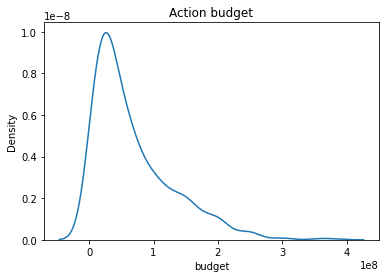

In [50]:
# fig = sns.kdeplot(data=comedy_df,x='budget', hue='sex')
fig = sns.kdeplot(data=genre_df, x='budget')
fig.set(title = "Action budget")
plt.show()

[Text(0.5, 1.0, 'Action budget')]

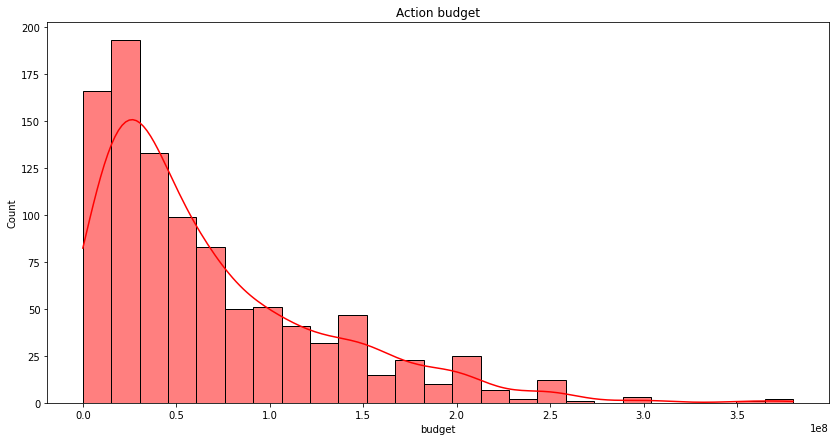

In [102]:
plt.figure(figsize=(14,7)) 
hist_dist = sns.histplot(data=genre_df, x="budget", kde=True, color='red')
hist_dist.set(title='Action budget')

# plt.ticklabel_format(style='plain')  

[Text(0.5, 1.0, 'Action revenue')]

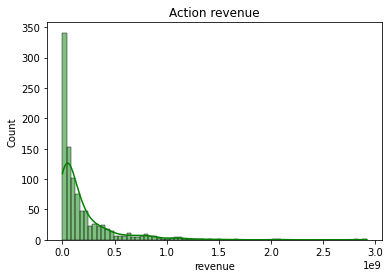

In [52]:
hist_dist = sns.histplot(data=genre_df, x="revenue", kde=True, color='green')
hist_dist.set(title='Action revenue')

[Text(0.5, 1.0, 'Action number of votes')]

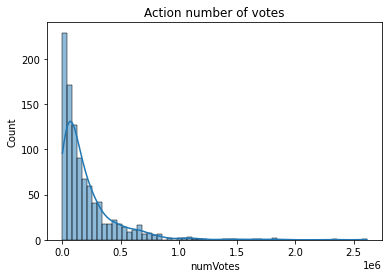

In [54]:
hist_dist = sns.histplot(data=genre_df, x="numVotes", kde=True)
hist_dist.set(title='Action number of votes')

In [56]:
# Group movies by year
start_year_df = genre_df.groupby(['startYear']).mean()

In [58]:
start_year_df['budget']

startYear
2000    5.961034e+07
2001    5.503049e+07
2002    5.791111e+07
2003    6.779236e+07
2004    6.225930e+07
2005    6.560930e+07
2006    5.636002e+07
2007    6.820034e+07
2008    6.660255e+07
2009    6.991153e+07
2010    6.533333e+07
2011    6.141361e+07
2012    7.339461e+07
2013    7.161530e+07
2014    6.920242e+07
2015    7.523134e+07
2016    7.184371e+07
2017    8.855560e+07
2018    6.629583e+07
2019    7.830988e+07
Name: budget, dtype: float64

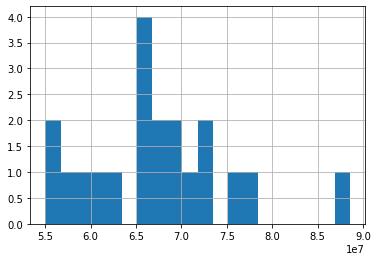

In [67]:
# hist = start_year_df.hist(bins=20)
barplot = start_year_df['budget'].hist(bins=20)

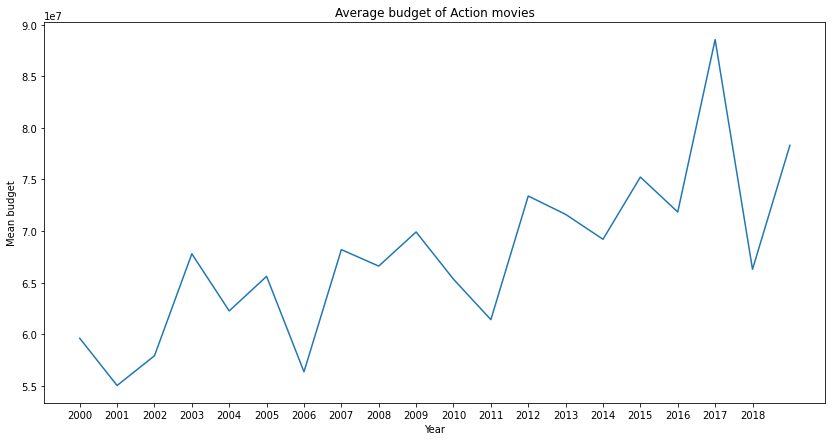

In [89]:
plt.figure(figsize=(14,7)) 
line_plot = start_year_df['budget'].plot.line()
line_plot.set(title='Average budget of Action movies')
plt.xlabel('Year')
plt.ylabel('Average budget')
plt.xticks(np.arange(2000, 2019, step=1))
plt.show()

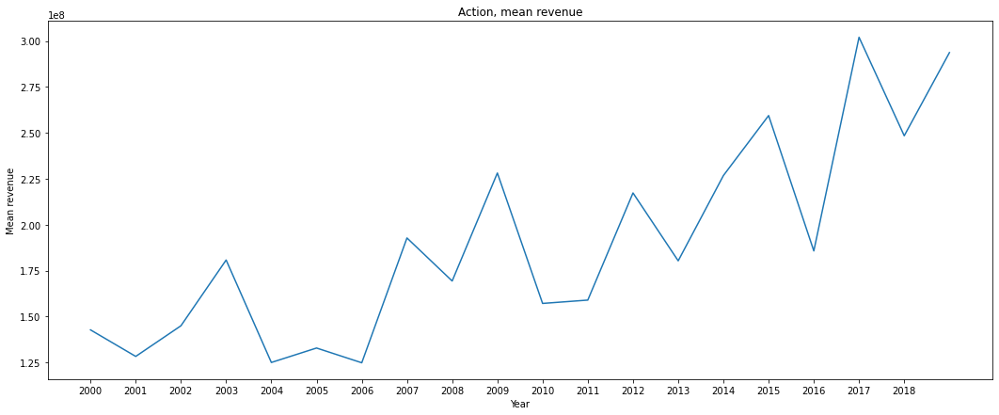

In [76]:
plt.figure(figsize=(14,7)) 
line_plot = start_year_df['revenue'].plot.line()
line_plot.set(title='Action, mean revenue')
plt.xlabel('Year')
plt.ylabel('Mean revenue')
plt.xticks(np.arange(2000, 2019, step=1))
plt.show()

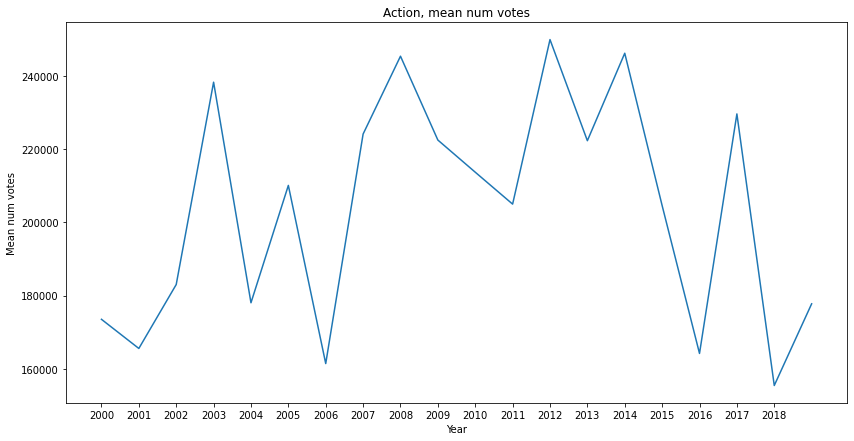

In [81]:
plt.figure(figsize=(14,7)) 
line_plot = start_year_df['numVotes'].plot.line()
line_plot.set(title='Action, mean num votes')
plt.xlabel('Year')
plt.ylabel('Mean num votes')
plt.xticks(np.arange(2000, 2019, step=1))

fig_name = 'Action, mean num votes'
plots_path = current_path + '/movie_plots'
plt.savefig(plots_path + '/' + fig_name + '.png')
plt.show()

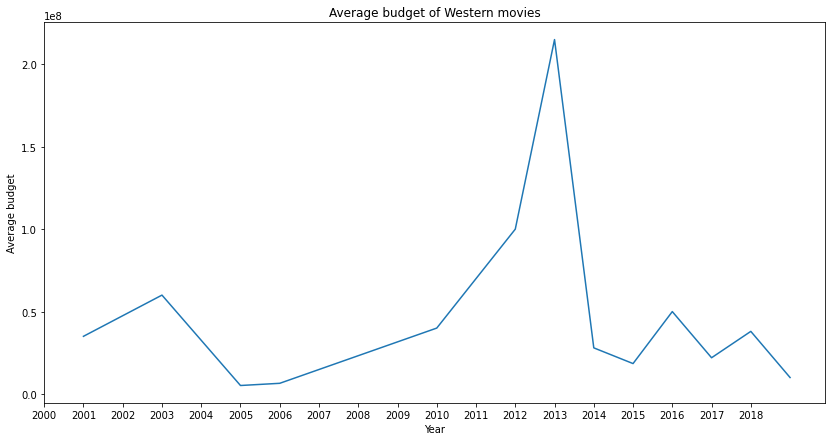

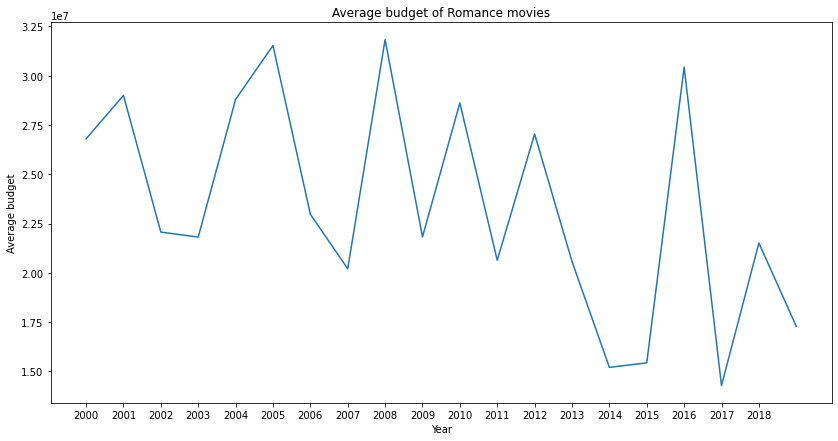

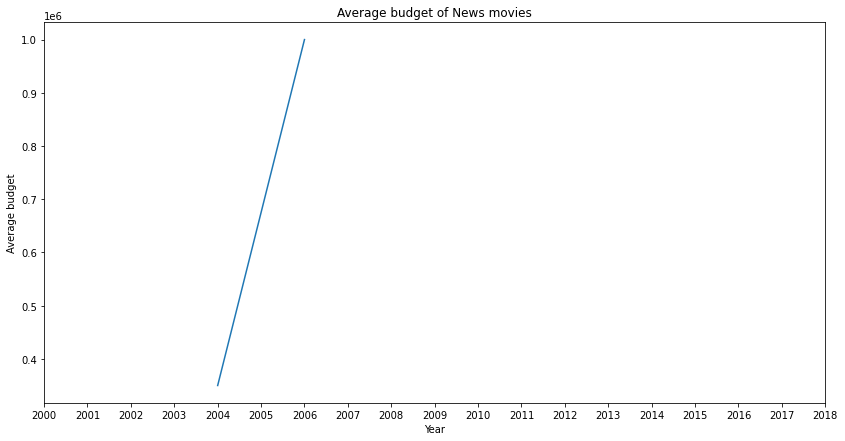

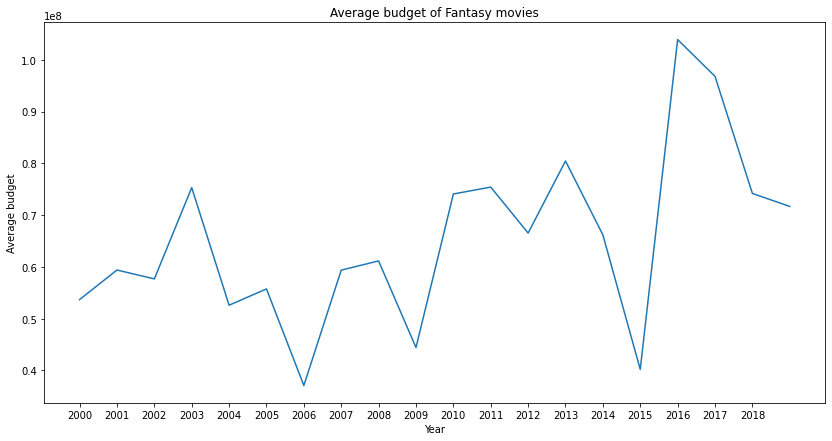

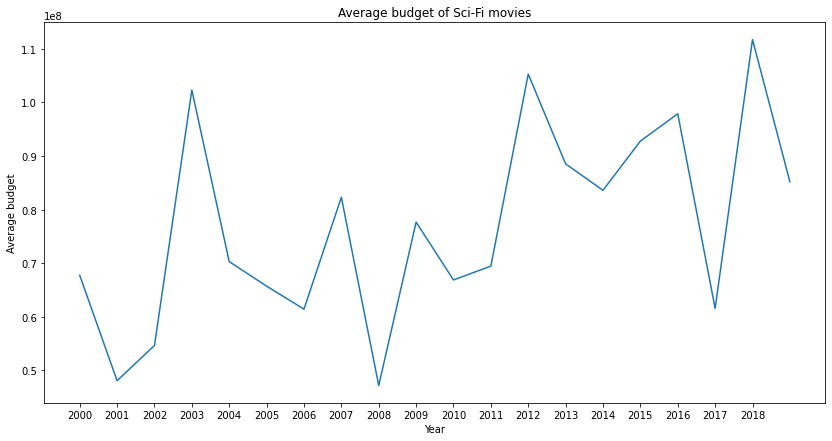

...

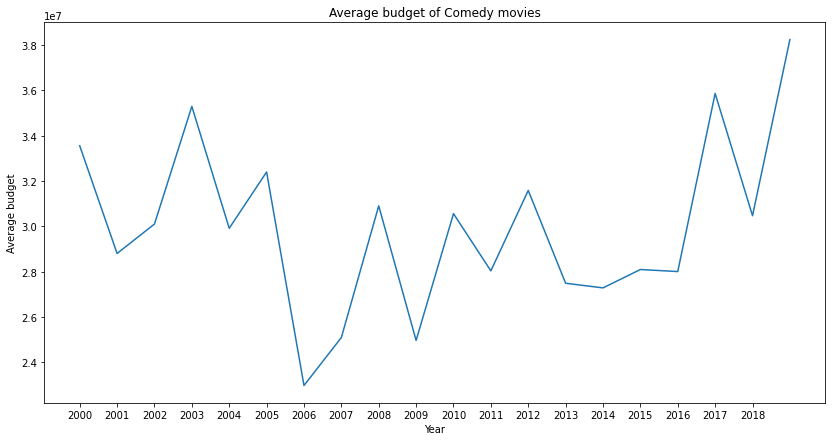

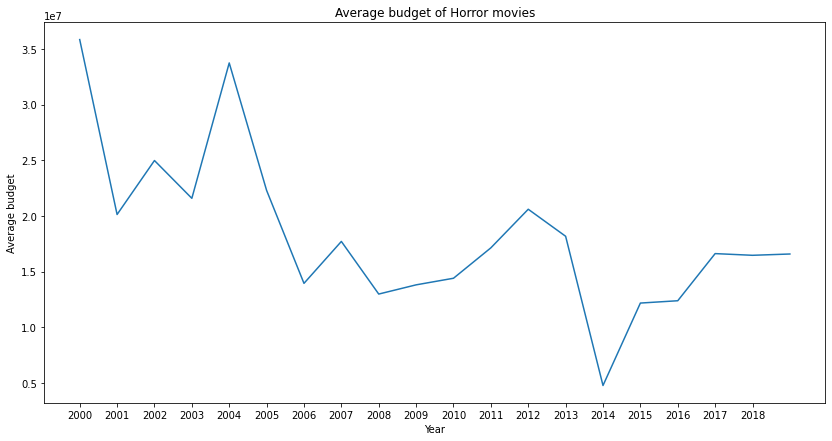

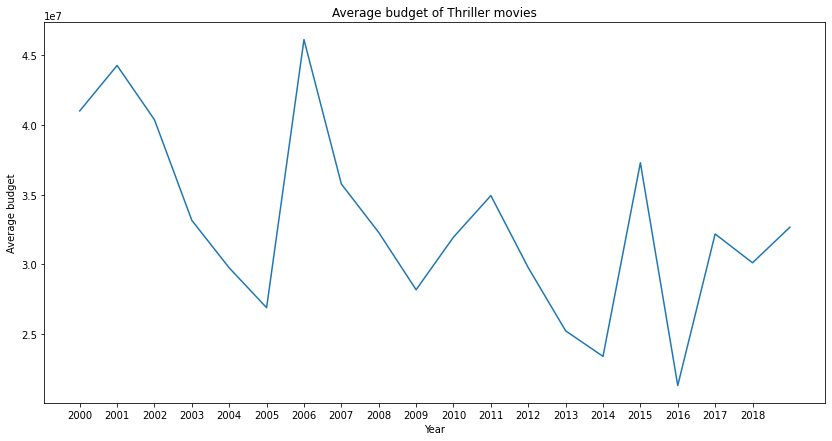

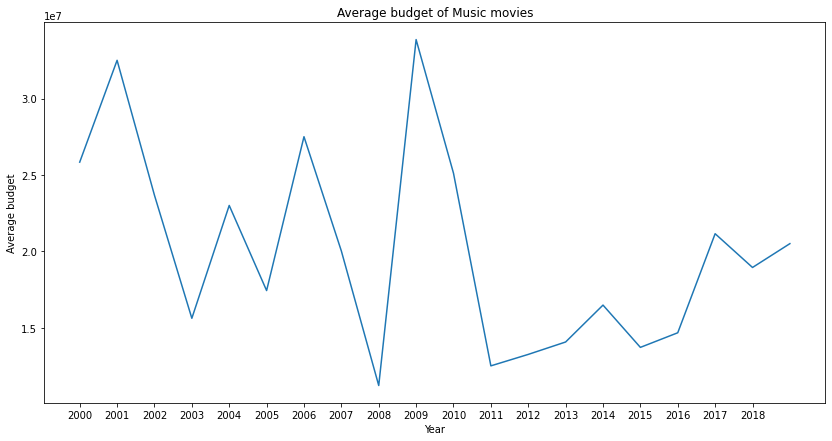

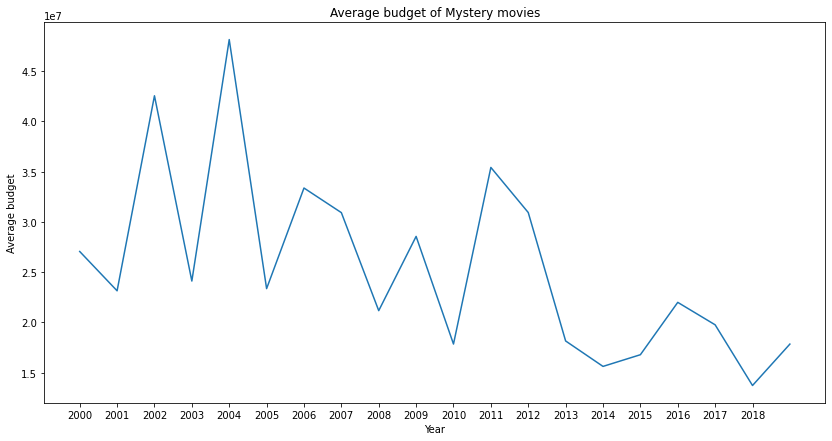

In [91]:
# Function to generate Budget plots by Genre 
i = 0
for key, value in movies_dict.items():
    genre_list = value
    genre_df = pd.DataFrame(genre_list)

    # Group movies by year and calculate the mean values for all numerical columns
    start_year_df = genre_df.groupby(['startYear']).mean()

    # Plot Genre and Average budget by year
    plt.figure(figsize=(14,7)) 
    line_plot = start_year_df['budget'].plot.line()
    title = 'Average budget of ' + key + ' movies'
    line_plot.set(title=title)
    plt.xlabel('Year')
    plt.ylabel('Average budget')
    plt.xticks(np.arange(2000, 2019, step=1))

    # Save fig
    plots_path = current_path + '/movie_plots'
    plt.savefig(plots_path + '/' + title + '.png')

    plt.show()
    

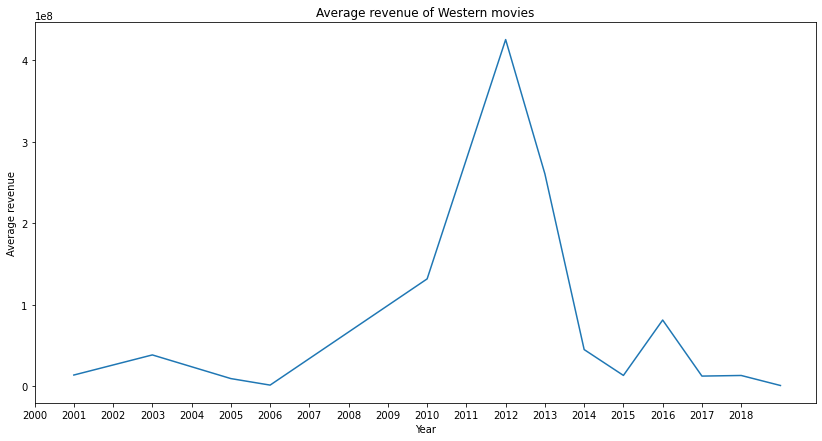

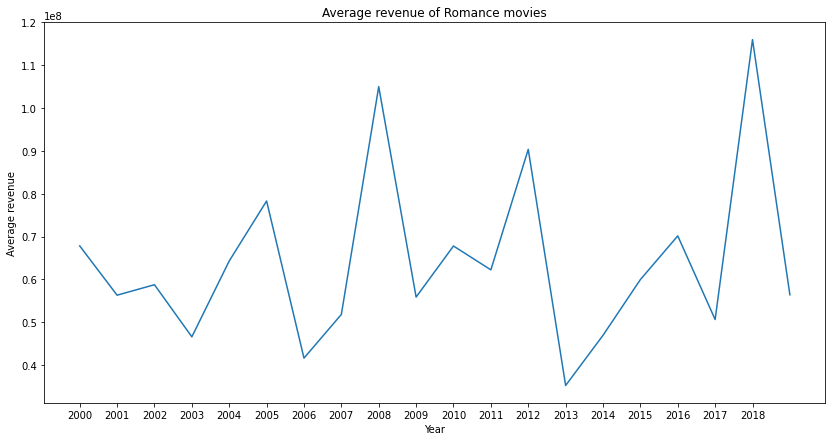

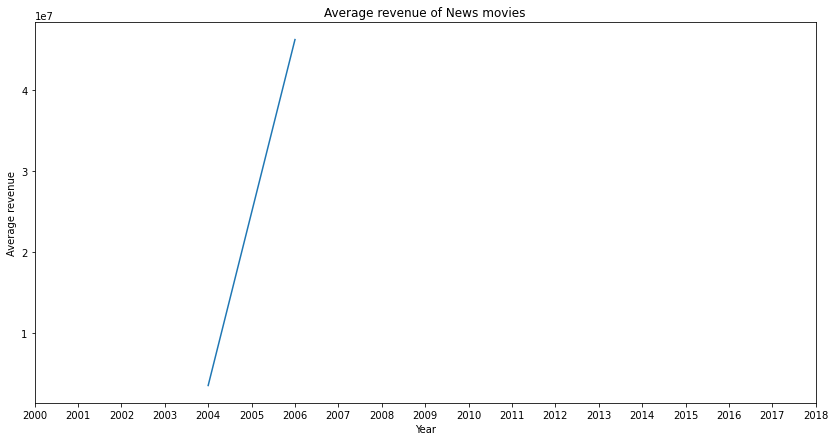

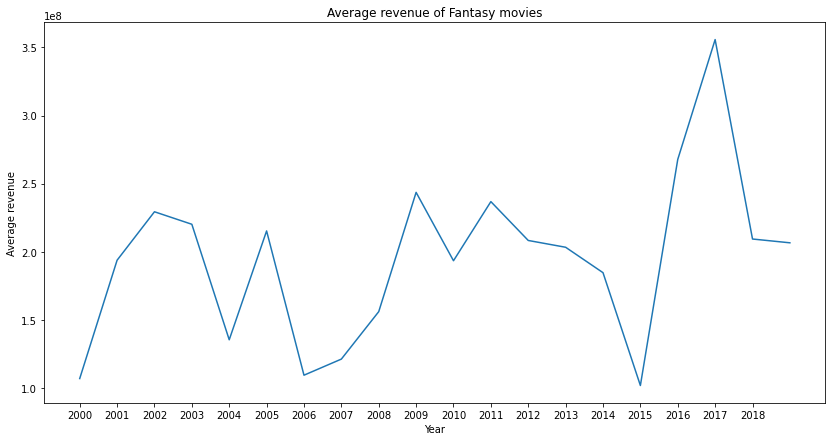

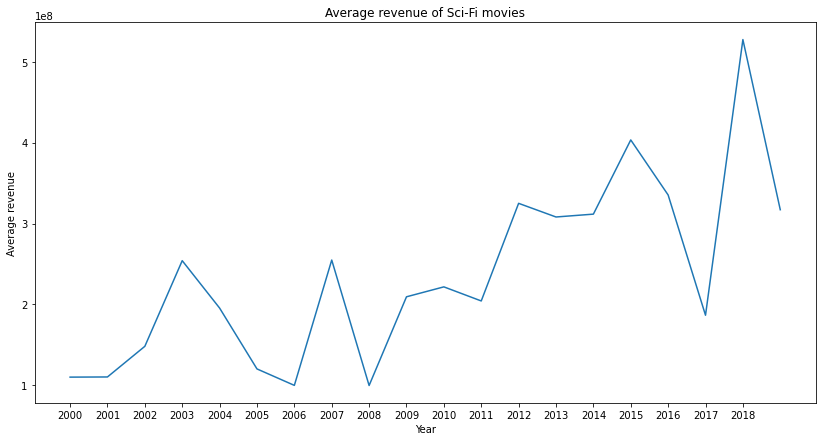

...

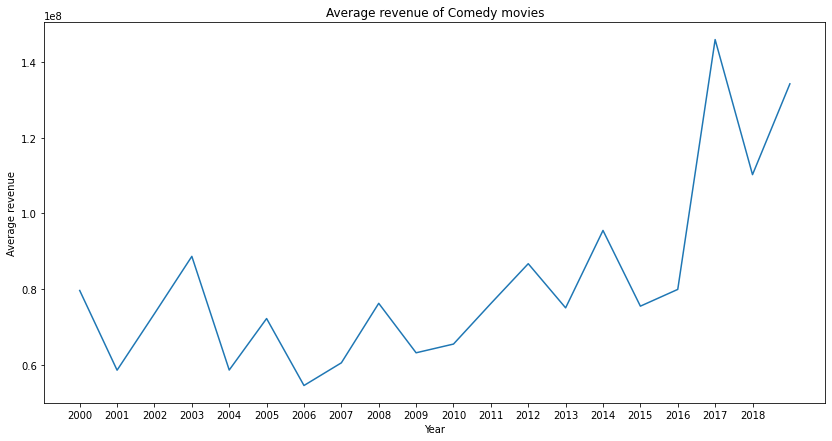

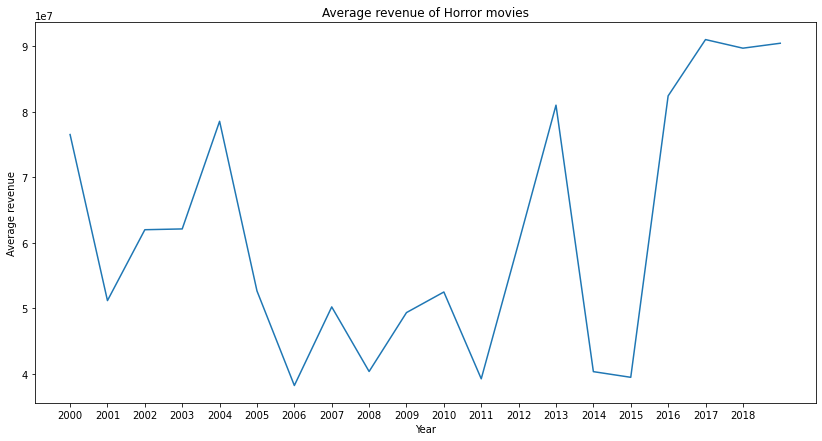

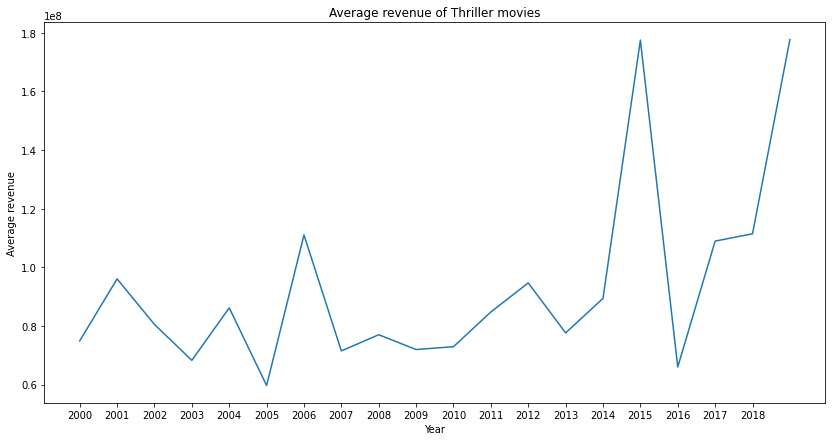

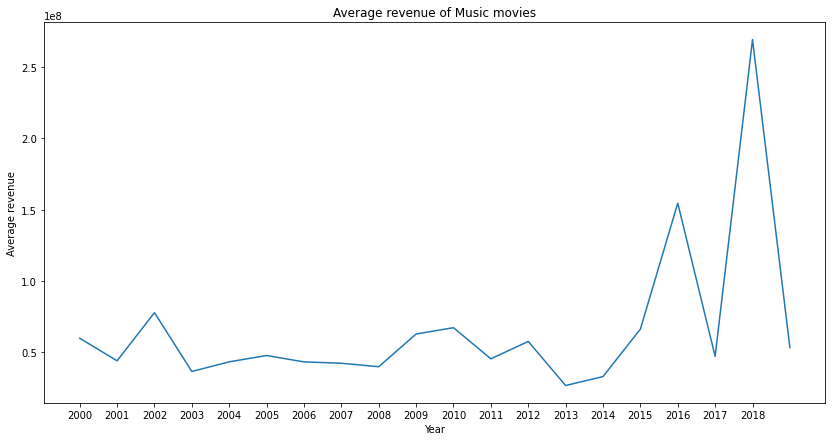

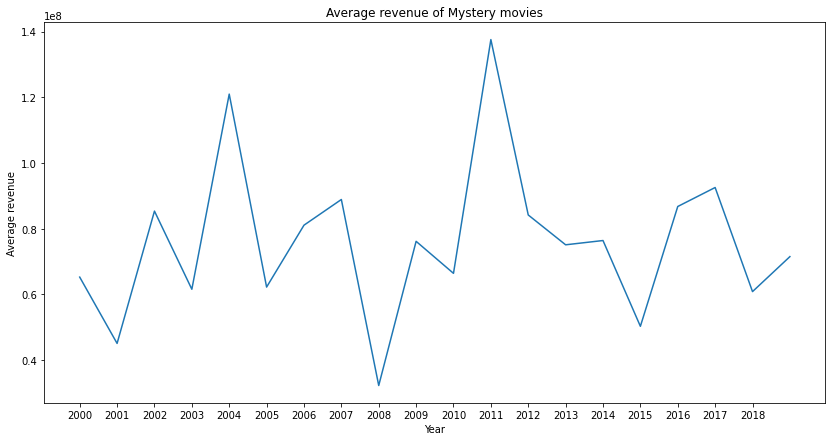

In [92]:
# Function to generate Revenue plots by Genre 
i = 0
for key, value in movies_dict.items():
    genre_list = value
    genre_df = pd.DataFrame(genre_list)

    # Group movies by year and calculate the mean values for all numerical columns
    start_year_df = genre_df.groupby(['startYear']).mean()

    # Plot Genre and Average budget by year
    plt.figure(figsize=(14,7)) 
    line_plot = start_year_df['revenue'].plot.line()
    title = 'Average revenue of ' + key + ' movies'
    line_plot.set(title=title)
    plt.xlabel('Year')
    plt.ylabel('Average revenue')
    plt.xticks(np.arange(2000, 2019, step=1))

    # Save fig
    plots_path = current_path + '/movie_plots'
    plt.savefig(plots_path + '/' + title + '.png')

    plt.show()
    

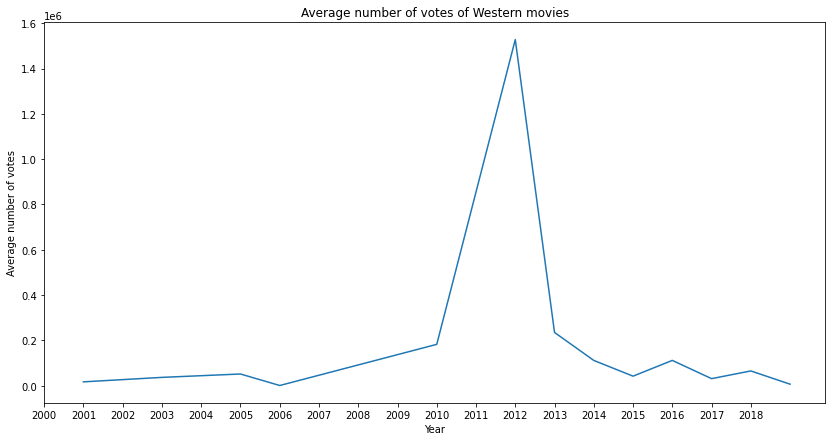

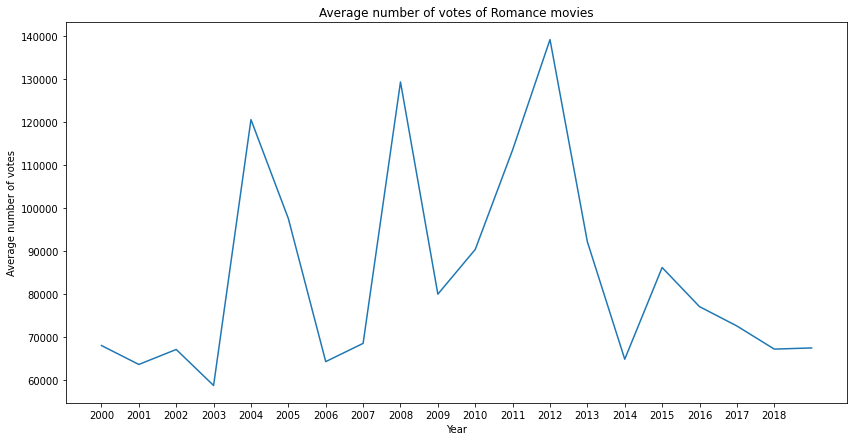

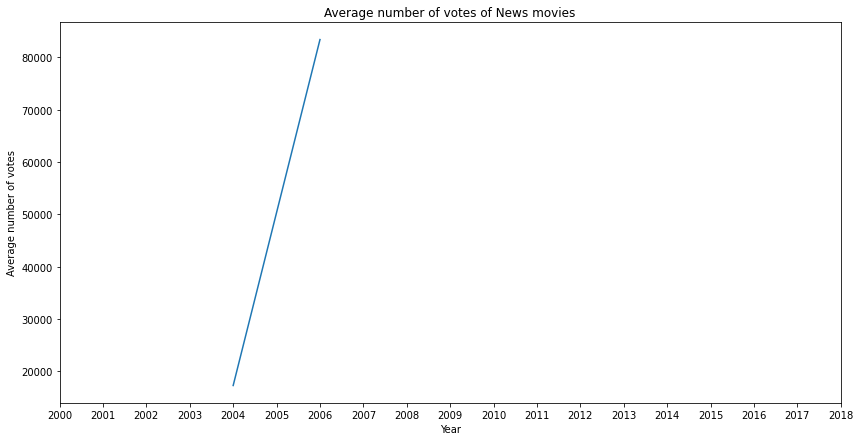

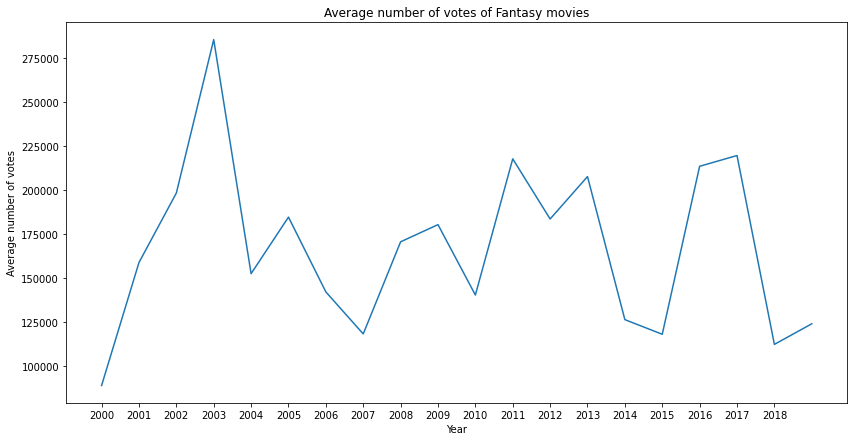

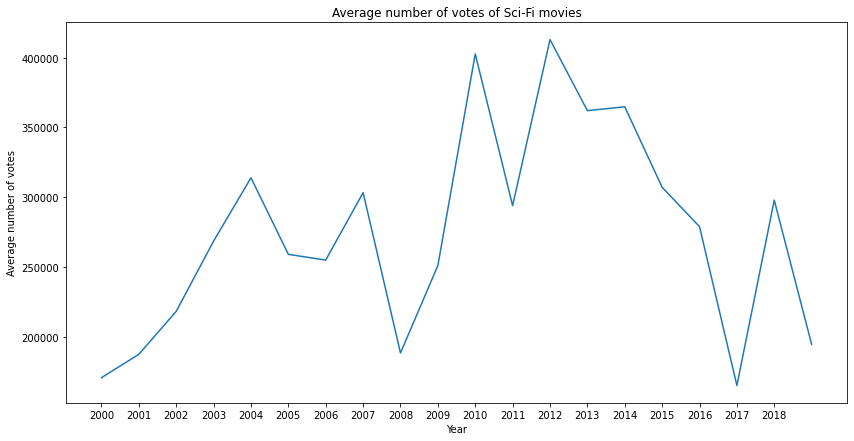

...

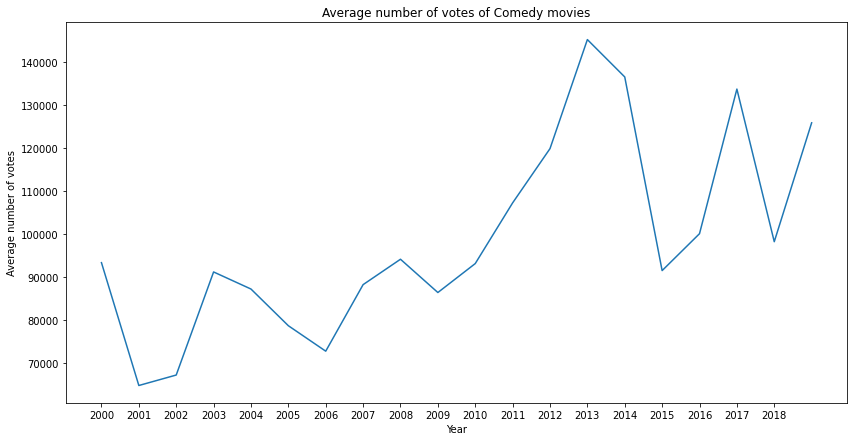

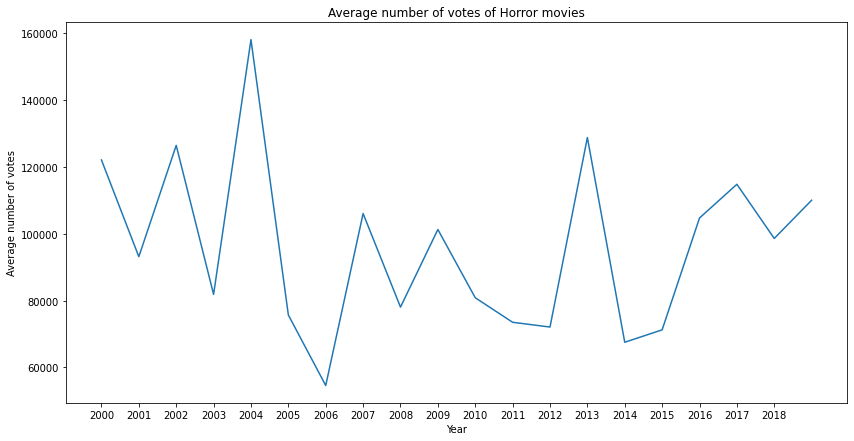

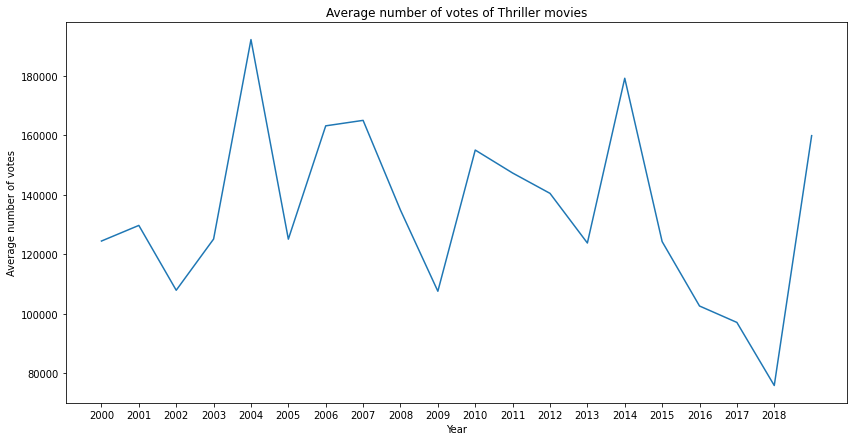

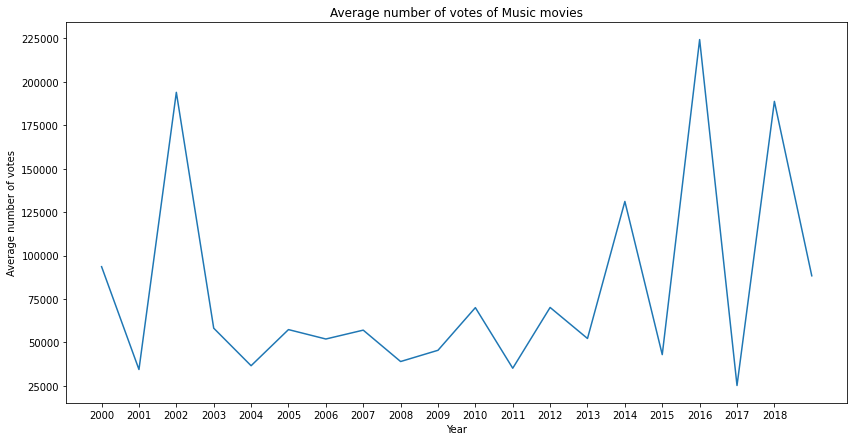

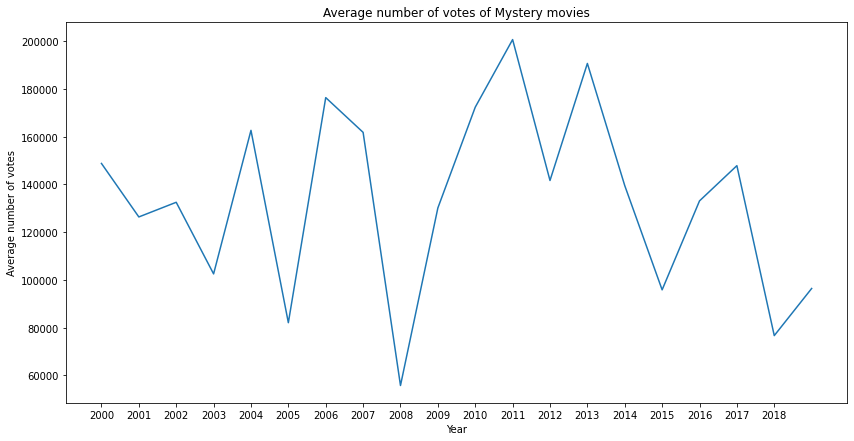

In [93]:
# Function to generate Num votes plots by Genre 
i = 0
for key, value in movies_dict.items():
    genre_list = value
    genre_df = pd.DataFrame(genre_list)

    # Group movies by year and calculate the mean values for all numerical columns
    start_year_df = genre_df.groupby(['startYear']).mean()

    # Plot Genre and Average budget by year
    plt.figure(figsize=(14,7)) 
    line_plot = start_year_df['numVotes'].plot.line()
    title = 'Average number of votes of ' + key + ' movies'
    line_plot.set(title=title)
    plt.xlabel('Year')
    plt.ylabel('Average number of votes')
    plt.xticks(np.arange(2000, 2019, step=1))

    # Save fig
    plots_path = current_path + '/movie_plots'
    plt.savefig(plots_path + '/' + title + '.png')

    plt.show()
    

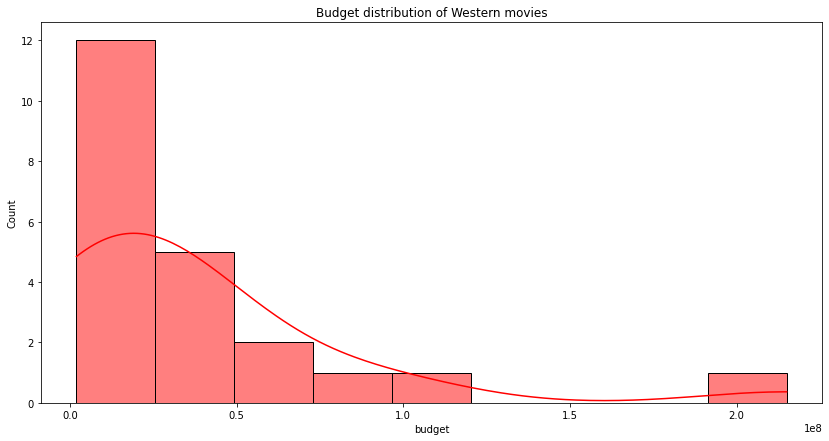

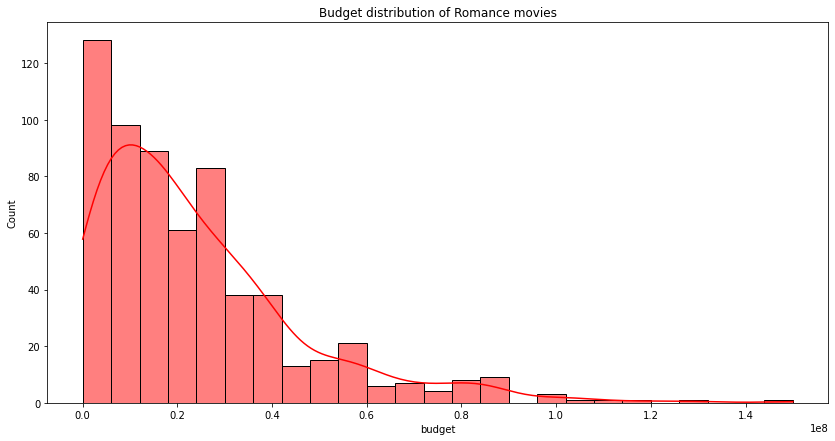

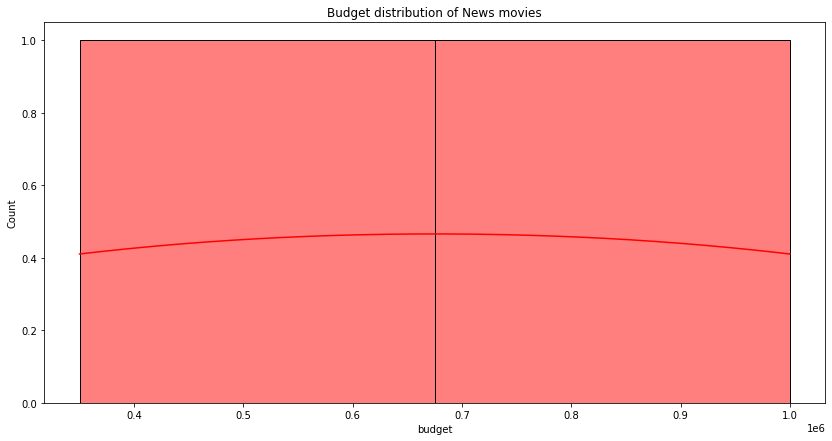

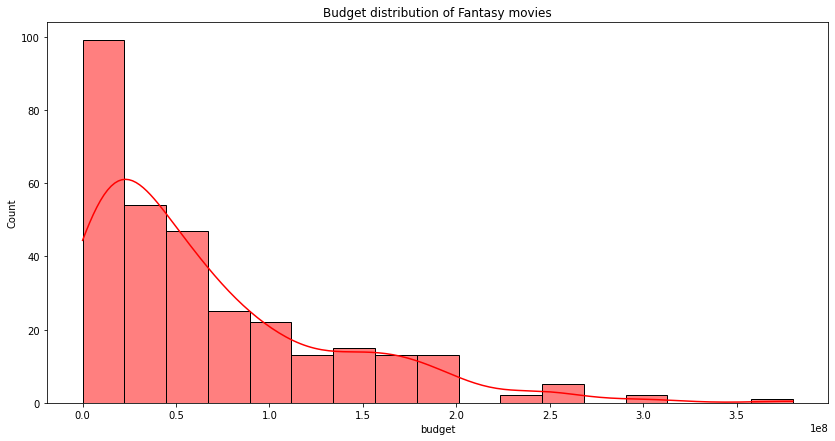

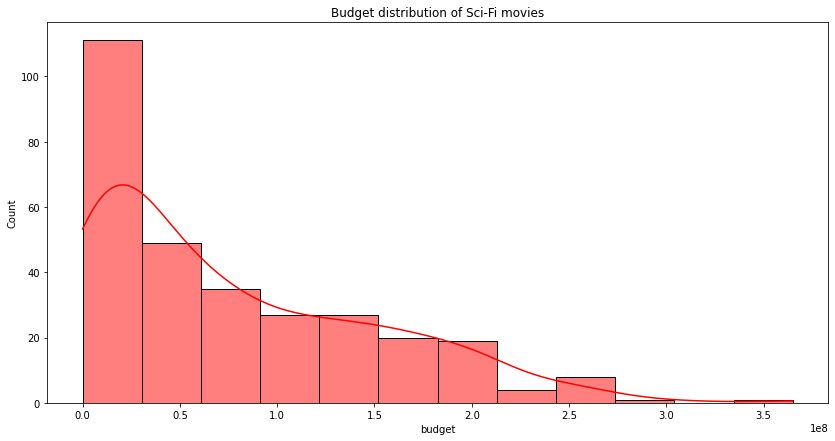

...

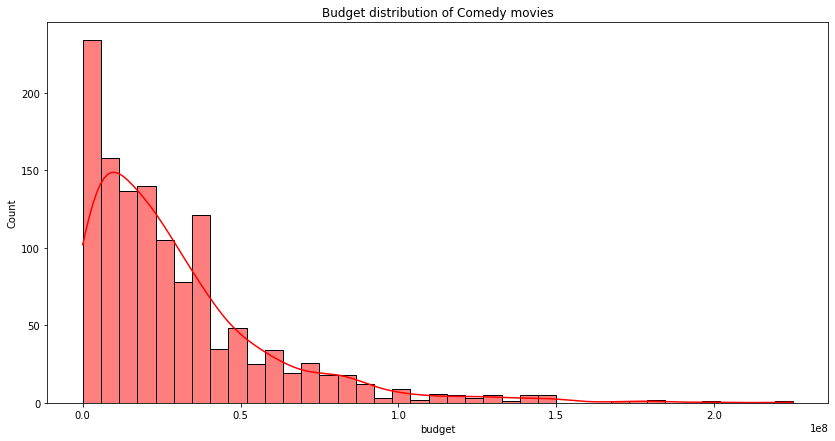

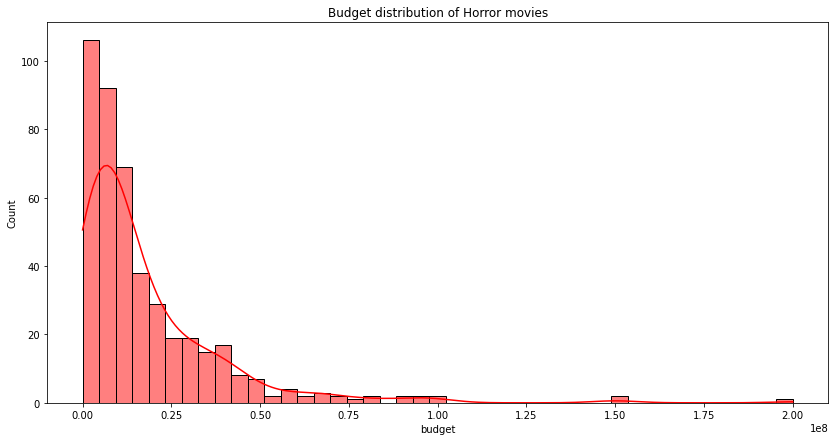

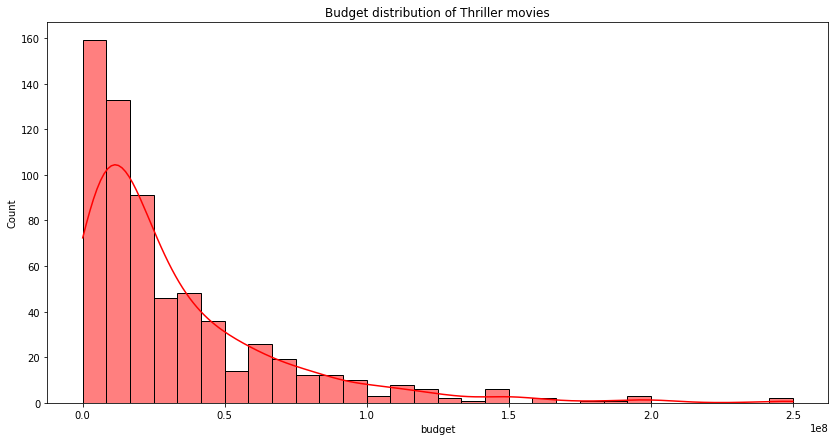

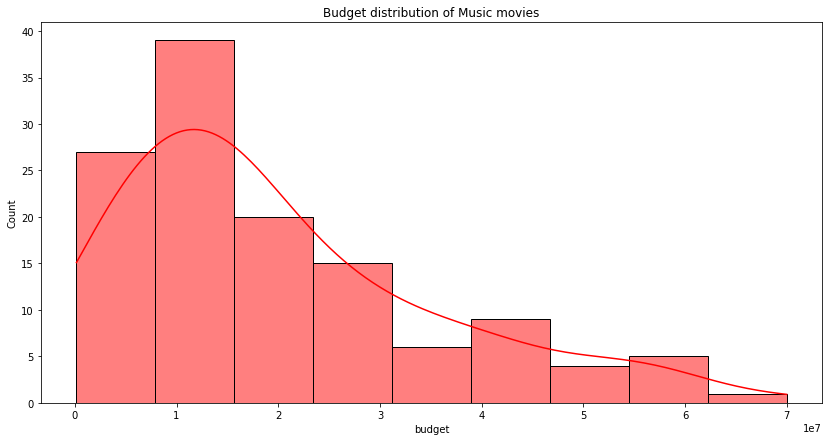

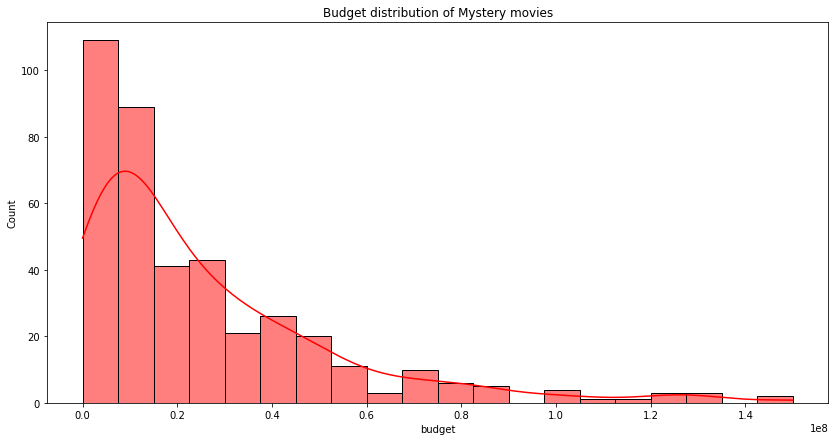

In [105]:
# Function to generate Budget distribution plots by Genre 
i = 0
for key, value in movies_dict.items():
    genre_list = value
    genre_df = pd.DataFrame(genre_list)

    # Plot Genre and budget distribution by year
    plt.figure(figsize=(14,7)) 
    hist_dist = sns.histplot(data=genre_df, x="budget", kde=True, color='red')
    title = 'Budget distribution of ' + key + ' movies'
    hist_dist.set(title=title)

    # Save fig
    plots_path = current_path + '/movie_plots/Budget distribution'
    plt.savefig(plots_path + '/' + title + '.png')

    plt.show()
    

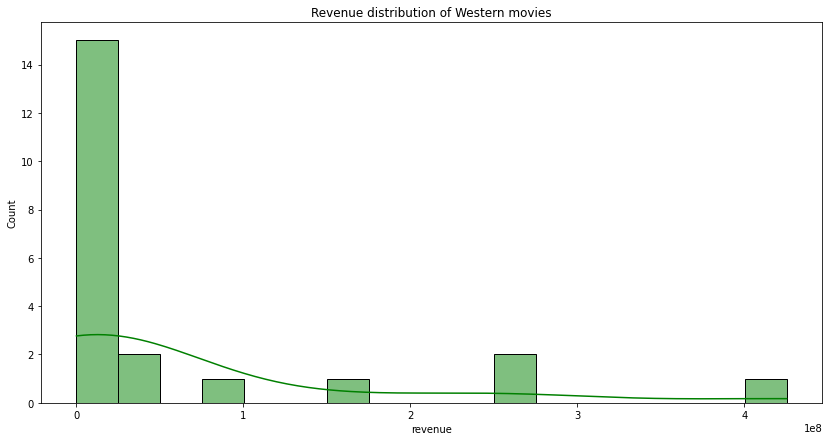

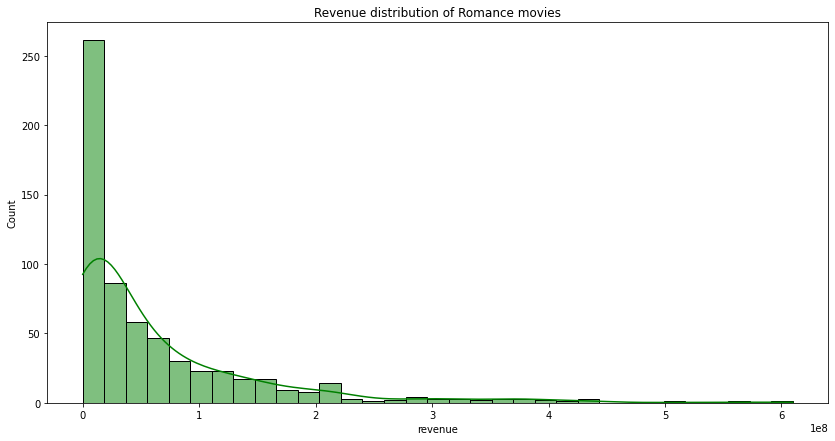

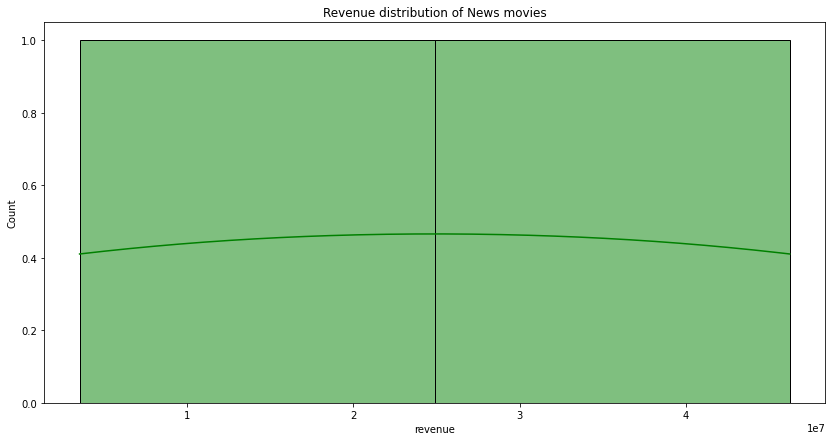

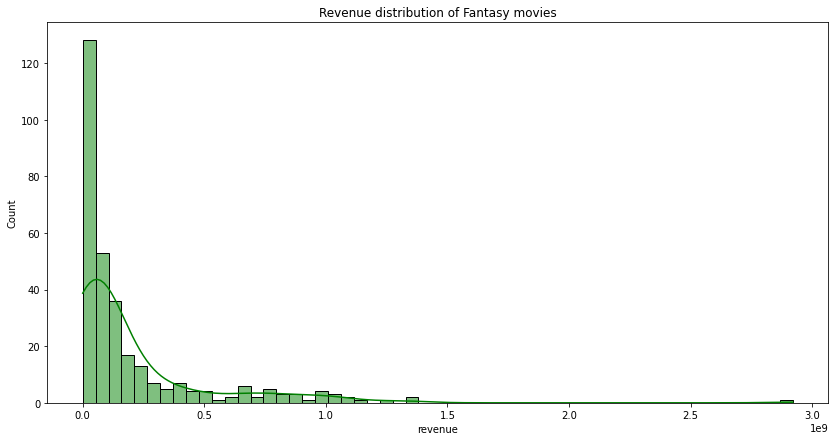

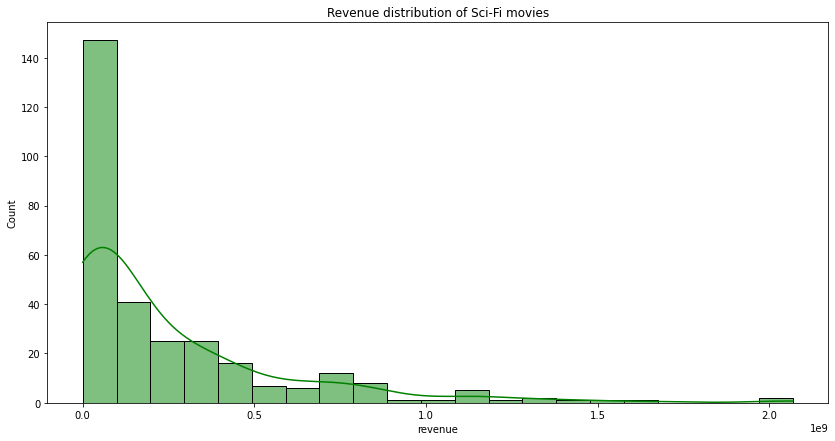

...

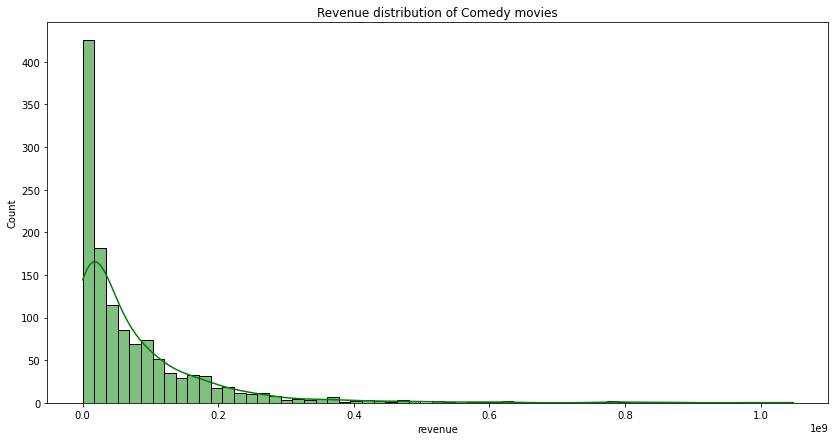

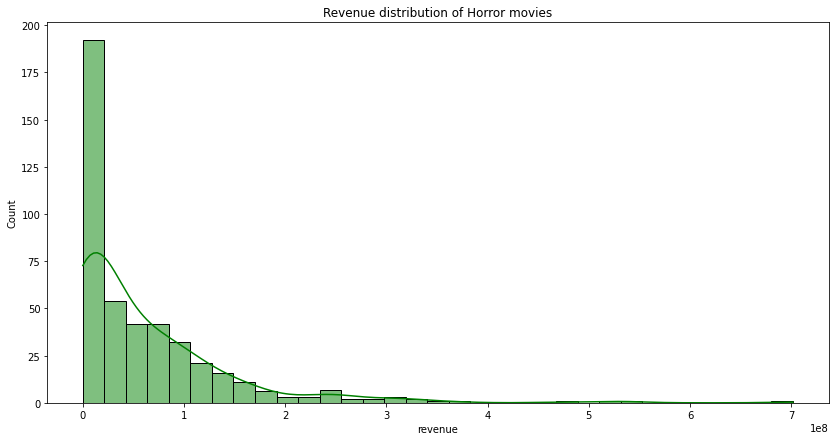

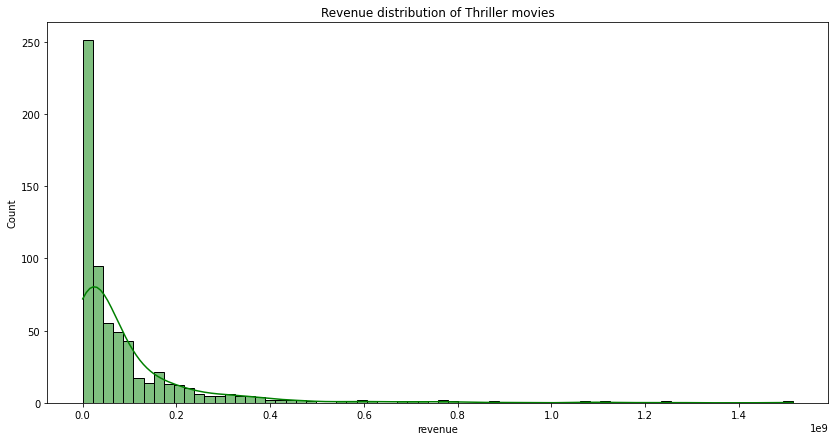

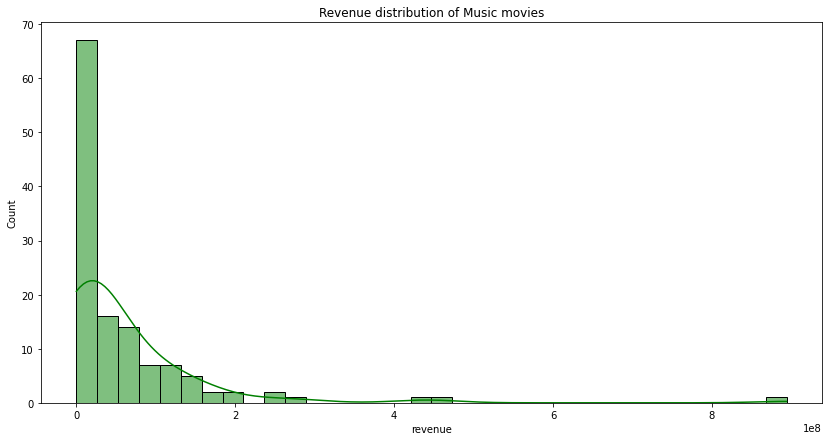

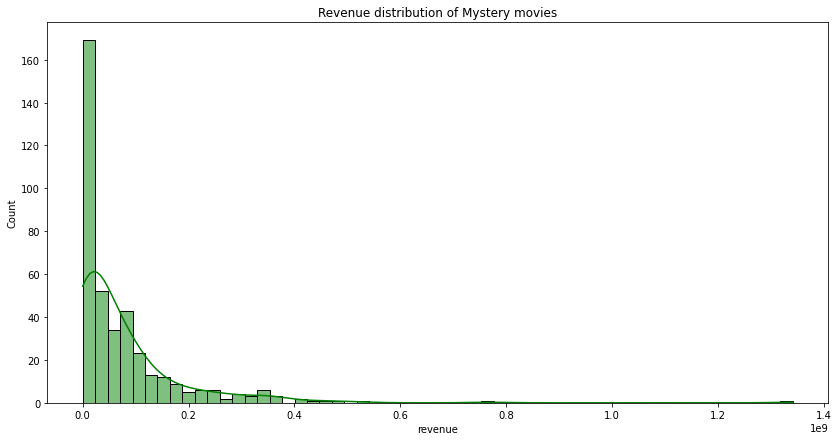

In [106]:
# Function to generate Revenue distribution plots by Genre 
i = 0
for key, value in movies_dict.items():
    genre_list = value
    genre_df = pd.DataFrame(genre_list)

    # Plot Genre and budget distribution by year
    plt.figure(figsize=(14,7)) 
    hist_dist = sns.histplot(data=genre_df, x="revenue", kde=True, color='green')
    title = 'Revenue distribution of ' + key + ' movies'
    hist_dist.set(title=title)

    # Save fig
    plots_path = current_path + '/movie_plots/Revenue distribution'
    plt.savefig(plots_path + '/' + title + '.png')

    plt.show()
    

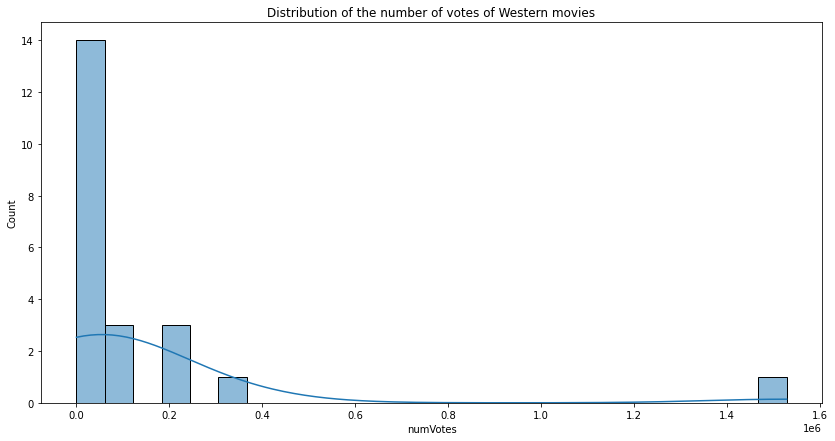

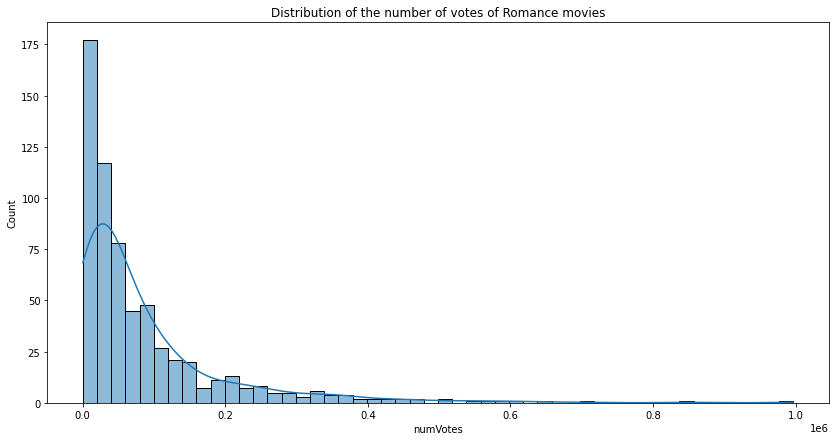

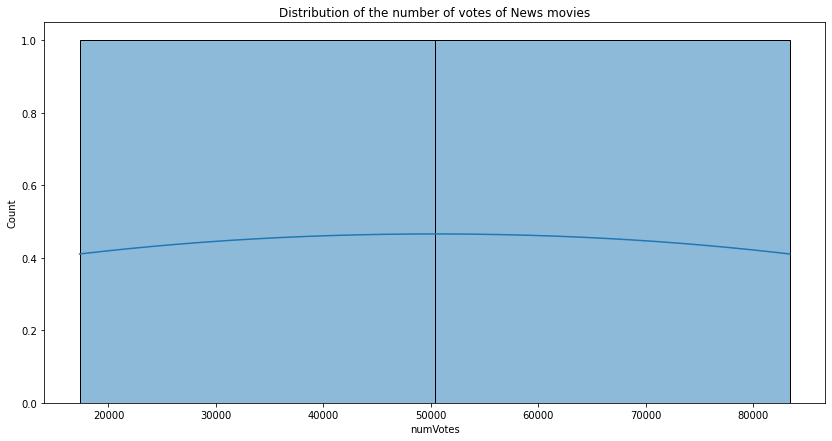

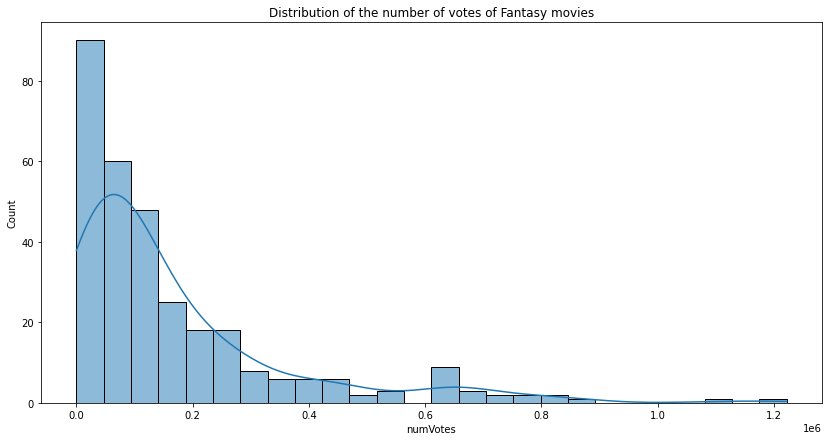

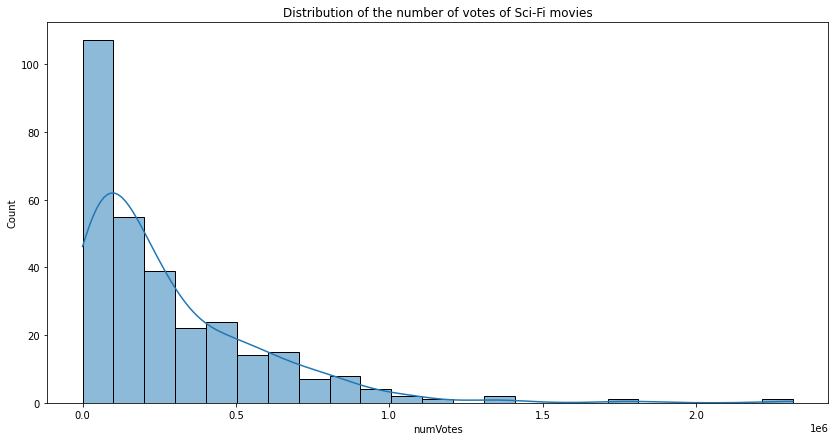

...

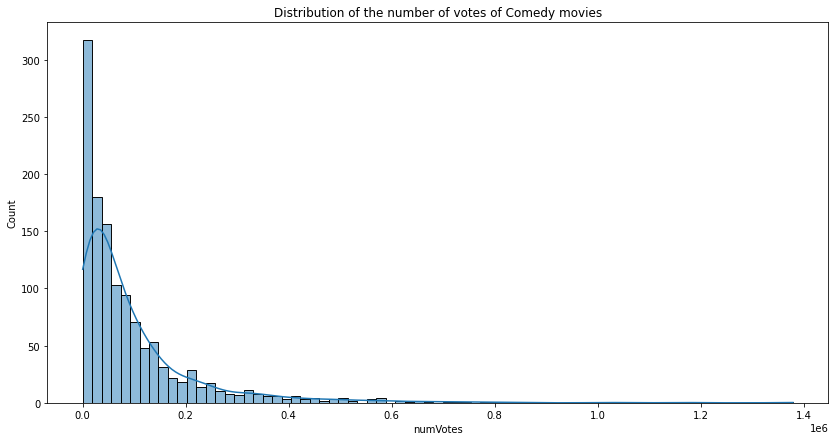

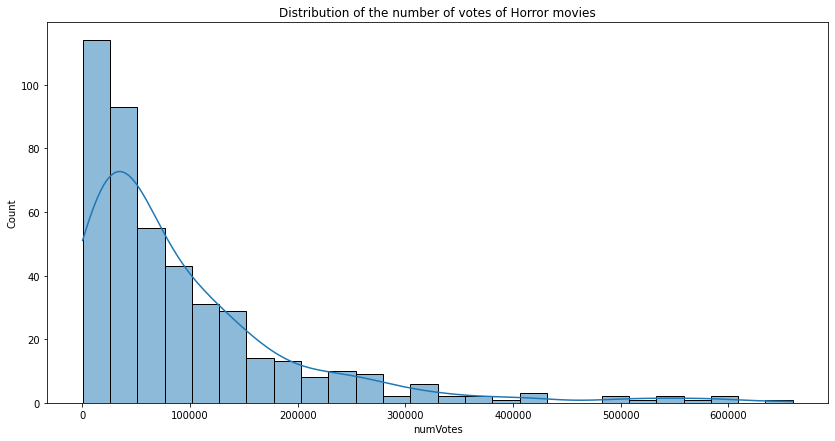

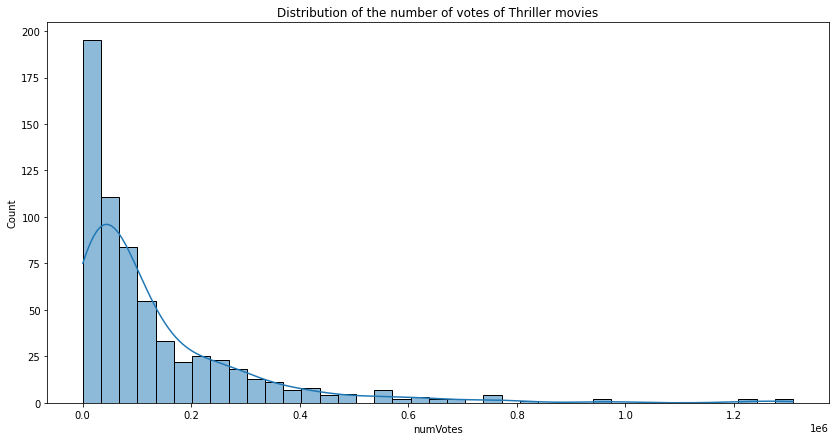

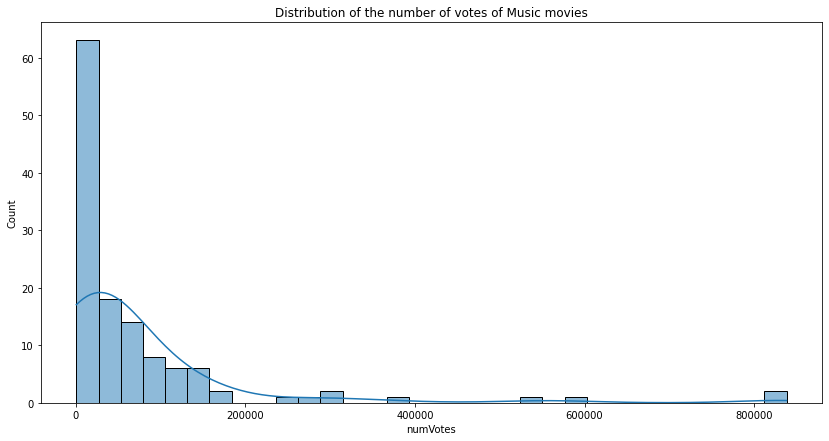

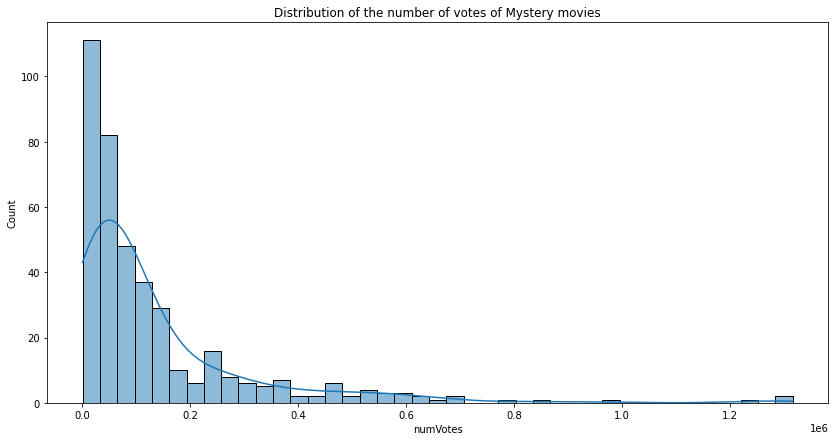

In [107]:
# Function to generate Revenue distribution plots by Genre 
i = 0
for key, value in movies_dict.items():
    genre_list = value
    genre_df = pd.DataFrame(genre_list)

    # Plot Genre and budget distribution by year
    plt.figure(figsize=(14,7)) 
    hist_dist = sns.histplot(data=genre_df, x="numVotes", kde=True)
    title = 'Distribution of the number of votes of ' + key + ' movies'
    hist_dist.set(title=title)

    # Save fig
    plots_path = current_path + '/movie_plots/Num of votes distribution'
    plt.savefig(plots_path + '/' + title + '.png')

    plt.show()
    